# RFM clustering using Hierarchical Clustering

## Agglomerative

The principle is simple : at start all points are clusters and then using distance we try step by step to group clusters in bigger clusters.

To do that, the algorithm consider two data:
* the intra cluster variance ;
* the inter cluster variance ;

Like in K-Means, we need to define the number of clusters `n_clusters` and the `linkage` property.

The `linkage` property determines which distance to use between observations.

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.cluster import AgglomerativeClustering

rfm = pd.read_csv("./../../../output/rfm.csv")

y = rfm["nb_orders"]

X_train, X_test, y_train, y_test = train_test_split(
    rfm, y, test_size=0.2, random_state=42, stratify=y
)
rfm = X_test

rfm.head()

,customer_unique_id,recency,frequency,monetary,nb_orders,first_order,last_order,days_between_orders,scoring_R,scoring_F,scoring_M,scoring_RFM,segment_RFM
53201,9271d8382e15324f1704571bb2dd3147,131.0,0.200000,208.24,1.0,2018-04-20 17:21:55,2018-04-20 17:21:55,0,4,4,5,13,Très bons clients
22300,3d24f8153934396ca881e3124da2dfff,113.0,0.200000,102.27,1.0,2018-05-09 09:20:22,2018-05-09 09:20:22,0,4,4,3,11,Bons clients
73021,c87a62e76b9ddba752d818984e8ed12f,211.0,0.125000,439.72,1.0,2018-01-31 11:48:43,2018-01-31 11:48:43,0,3,3,5,11,Bons clients
26915,49d1599dd80dedc213037342bbe43fd7,256.0,0.125000,118.57,2.0,2017-06-02 19:56:30,2017-12-17 10:50:51,197,3,3,3,9,Bons clients
16899,2e4172f7fd898dac91afe1173e9cfc37,195.0,0.142857,336.99,1.0,2018-02-15 22:14:25,2018-02-15 22:14:25,0,3,3,5,11,Bons clients


We scale the data:

In [2]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
customers_vars = rfm[["recency", "frequency", "monetary"]]
scaler.fit(customers_vars)

scaled_customers = scaler.transform(customers_vars)

scaled_customers

array([[-0.70064481,  0.04761407,  0.17702337],
       [-0.81829319,  0.04761407, -0.25298665],
       [-0.17776313, -0.34726816,  1.11633375],
       ...,
       [-0.34116366, -0.25324858, -0.31235295],
       [-1.27581466,  1.62714299,  0.03706824],
       [ 0.10328577, -0.4203945 , -0.26292838]])

,nb_clusters,silhouette_score
0,3,0.404287
1,4,0.435222
2,5,0.436444
3,6,0.433640


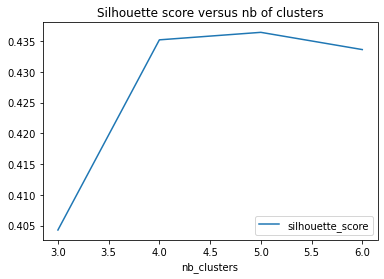

In [3]:
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics

report = []
for nb_clusters in range(3, 7):
    agg_clustering = AgglomerativeClustering(n_clusters=nb_clusters).fit(
        scaled_customers
    )

    report.append(
        {
            "nb_clusters": nb_clusters,
            "silhouette_score": metrics.silhouette_score(
                scaled_customers, agg_clustering.labels_
            ),
        }
    )

report = pd.DataFrame(report)
report.plot(
    title="Silhouette score versus nb of clusters",
    x="nb_clusters",
    y="silhouette_score",
)

report

Let's display the dendrogram to confirm that the optimal number of clusters may be **4 or 5**.


In [4]:
import scipy.cluster.hierarchy as sch
import plotly.figure_factory as ff

fig = ff.create_dendrogram(
    scaled_customers, linkagefun=lambda x: sch.linkage(x, "ward")
)
fig.update_layout(
    title="Hierarchical Clustering",
    xaxis_title="Customers",
    yaxis_title="Euclidean Distance",
    width=700,
    height=700,
)

fig.show()

In [10]:
agg_clustering = AgglomerativeClustering(n_clusters=4).fit(scaled_customers)

rfm["cluster"] = agg_clustering.labels_
rfm.cluster = rfm.cluster.astype("category")
print(rfm.cluster.value_counts())
print(metrics.silhouette_score(scaled_customers, rfm["cluster"]))

3    8132
2    8115
1    1990
0     385
Name: cluster, dtype: int64
0.43522243698699337


In [11]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, learning_rate="auto", init="random", n_jobs=-1)
projected_customers = tsne.fit_transform(scaled_customers)

fig = px.scatter(
    projected_customers,
    x=0,
    y=1,
    color=rfm.cluster,
    labels={"color": "cluster"},
    opacity=0.8,
)
fig.show()

### Conclusions

The hierarchical clustering is also in favor of 4 clusters to describe the dataset.

In [6]:
print("Done")

Done
